In [47]:
!pip install ydata-profiling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from io import StringIO
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

### Obtener el data

In [48]:
url = "https://api.covidtracking.com/v1/states/daily.csv"

response = requests.get(url) #para obtener el contenido del archivo CSV, devuelve texto (no es archivo ni objeto, solo texto)

if response.status_code == 200:
    csv_data = StringIO(response.text) # convertirlo a un objeto de tipo StringIO para que pandas pueda leerlo(pandas necesita un archivo o un objeto q contenga texto en csv)
    df = pd.read_csv(csv_data)
else:
    print(f"Error al leer el dataframe: {response.status_code}")


## Analisis descriptivo

In [49]:
df.sample()


,date,state,positive,probableCases,negative,pending,totalTestResultsSource,totalTestResults,hospitalizedCurrently,hospitalizedCumulative,...,dataQualityGrade,deathIncrease,hospitalizedIncrease,hash,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade
15617,20200602,VA,46239.0,2170.0,NaN,450.0,totalTestEncountersViral,369281.0,1362.0,4770.0,...,NaN,15,76,cddb6b2d41a971c8ad97c2f4ee61b72a5a3877d4,0,0,0,0,0,NaN


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   float64
 13  onVentilatorCumu

In [51]:
subset = df[["state", "date", "death", "deathIncrease","hospitalizedCumulative", "hospitalizedCurrently", "hospitalizedIncrease","positive", "positiveIncrease", "negative", "totalTestResults", "totalTestResultsIncrease", "recovered" ]]

In [52]:
subset.dtypes

,0
state,object
date,int64
death,float64
deathIncrease,int64
hospitalizedCumulative,float64
hospitalizedCurrently,float64
hospitalizedIncrease,int64
positive,float64
positiveIncrease,int64
negative,float64


In [53]:
subset.head(2)

,state,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
0,AK,20210307,305.0,0,1293.0,33.0,0,56886.0,0,NaN,1731628.0,0,NaN
1,AL,20210307,10148.0,-1,45976.0,494.0,0,499819.0,408,1931711.0,2323788.0,2347,295690.0


### Ajustar tipo de datos

In [54]:
# Convertir la fecha a formato datetime
subset['date'] = pd.to_datetime(subset['date'], format='%Y%m%d')

subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   state                     20780 non-null  object        
 1   date                      20780 non-null  datetime64[ns]
 2   death                     19930 non-null  float64       
 3   deathIncrease             20780 non-null  int64         
 4   hospitalizedCumulative    12382 non-null  float64       
 5   hospitalizedCurrently     17339 non-null  float64       
 6   hospitalizedIncrease      20780 non-null  int64         
 7   positive                  20592 non-null  float64       
 8   positiveIncrease          20780 non-null  int64         
 9   negative                  13290 non-null  float64       
 10  totalTestResults          20614 non-null  float64       
 11  totalTestResultsIncrease  20780 non-null  int64         
 12  recovered         

In [55]:
# Ordenar por estado y fecha
subset = subset.sort_values(by=['state', 'date'])
subset.head(2)

,state,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
20451,AK,2020-03-06,0.0,0,NaN,NaN,0,NaN,0,NaN,8.0,0,NaN
20400,AK,2020-03-07,0.0,0,NaN,NaN,0,NaN,0,NaN,12.0,4,NaN


In [56]:
subset['state'].unique()

array(['AK', 'AL', 'AR', 'AS', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
       'GA', 'GU', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA',
       'MD', 'ME', 'MI', 'MN', 'MO', 'MP', 'MS', 'MT', 'NC', 'ND', 'NE',
       'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI',
       'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VI', 'VT', 'WA', 'WI', 'WV',
       'WY'], dtype=object)

In [57]:
subset.describe().round(1)

,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
count,20780,19930.0,20780.0,12382.0,17339.0,20780.0,20592.0,20780.0,13290.0,20614.0,20780.0,12003.0
mean,2020-09-02 18:13:30.779595776,3682.2,24.8,9262.8,1190.6,37.4,165156.0,1383.8,848224.6,2186935.8,17508.4,94242.2
min,2020-01-13 00:00:00,0.0,-201.0,1.0,0.0,-12257.0,0.0,-7757.0,0.0,0.0,-130545.0,2.0
25%,2020-06-02 00:00:00,161.2,0.0,985.2,166.5,0.0,5753.8,65.0,53941.2,104049.8,1205.8,3379.0
50%,2020-09-03 00:00:00,1108.0,6.0,4472.0,531.0,0.0,46064.5,435.0,305972.0,655267.0,6125.0,17618.0
75%,2020-12-05 00:00:00,4387.5,24.0,12248.5,1279.0,36.0,177958.0,1335.2,1056611.2,2264766.5,19086.5,93152.5
max,2021-03-07 00:00:00,54124.0,2559.0,82237.0,22851.0,16373.0,3501394.0,71734.0,10186941.0,49646014.0,473076.0,2502609.0
std,NaN,6281.4,60.2,12620.5,2060.0,208.2,326785.2,3023.6,1344501.4,4436508.2,33586.0,211037.2


In [58]:
subset[subset['state'] == 'OH']

,state,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
20511,OH,2020-03-05,NaN,0,NaN,NaN,0,0.0,0,NaN,NaN,0,NaN
20478,OH,2020-03-06,NaN,0,NaN,NaN,0,0.0,0,NaN,3.0,3,NaN
20435,OH,2020-03-07,NaN,0,NaN,NaN,0,0.0,0,NaN,5.0,2,NaN
20384,OH,2020-03-08,NaN,0,NaN,NaN,0,0.0,0,NaN,6.0,1,NaN
20333,OH,2020-03-09,NaN,0,NaN,NaN,0,3.0,3,NaN,8.0,2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,OH,2021-03-03,17189.0,0,50613.0,1081.0,110,972605.0,2022,NaN,10101222.0,16741,916592.0
206,OH,2021-03-04,17189.0,0,50695.0,1009.0,82,974480.0,1875,NaN,10144547.0,43325,919296.0
150,OH,2021-03-05,17656.0,467,50782.0,919.0,87,976230.0,1750,NaN,10187678.0,43131,921707.0
94,OH,2021-03-06,17656.0,0,50848.0,922.0,66,977736.0,1506,NaN,10227868.0,40190,923986.0


In [59]:
#subset[subset['state'] == 'CA']['positiveIncrease'].sum()
#subset[subset['state'] == 'CT']['positive'].max()

In [60]:
profile = ProfileReport(subset,title="USA Covid cases. Profiling Report", explorative=True,)
profile.to_file("output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 19.13it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [61]:
from IPython.display import HTML # import the HTML object
HTML(filename='output.html') # render the file as a web page

## Missing data

In [62]:
# Calcular el porcentaje de data faltante por estado sobre las columnas detectadas como missing data en profile report

rows_state = subset.groupby('state')[['state']].size()
na_state = subset.groupby('state')[['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']].apply(lambda x: x.isna().sum())
perc_na = (na_state / rows_state.values[:, None]) * 100
perc_na = round(perc_na.fillna(0), 2)

print(perc_na)

       death  hospitalizedCurrently  hospitalizedCumulative  negative  \
state                                                                   
AK      0.00                  11.72                    0.82    100.00   
AL      2.19                   4.64                    7.65      0.82   
AR      4.36                   4.36                    7.08      0.00   
AS      0.56                 100.00                  100.00      4.20   
AZ      2.44                  10.84                    0.00      0.00   
CA      2.17                   6.23                  100.00     86.72   
CO      2.44                   4.61                    3.52      0.00   
CT      5.09                   5.90                   53.08    100.00   
DC      3.80                  12.23                  100.00    100.00   
DE      0.54                   5.18                  100.00      0.00   
FL     10.40                  40.35                   12.87      8.66   
GA      2.44                  15.72                

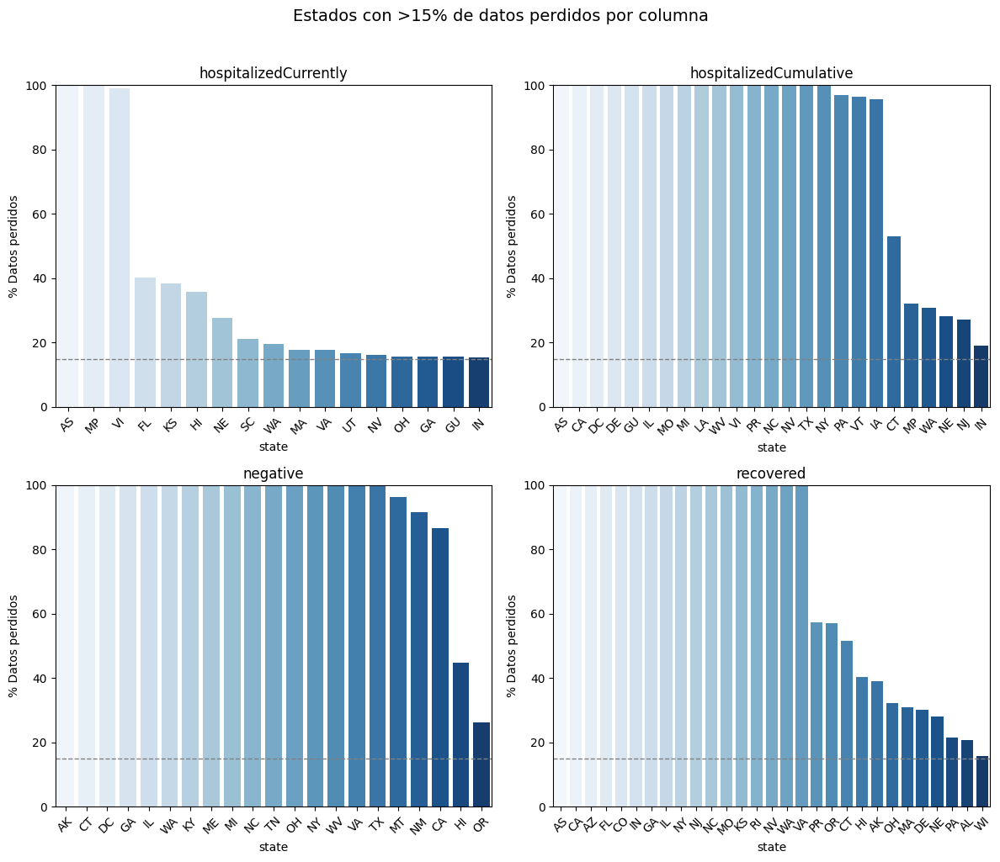

In [63]:
# Mostrar estados con más de 15% de datos faltantes por columna

columns_of_interest = ['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']

# Crear figura con subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # Ajustar para 2x2 subplots
fig.suptitle('Estados con >15% de datos perdidos por columna', y=1.02, fontsize=14)

# Aplanar los ejes para facilitar el acceso
axes = axes.flatten()

# Para contar cuántas columnas cumplen la condición
valid_columns = [col for col in columns_of_interest if not perc_na[perc_na[col] > 15][[col]].empty]

# Filtrar y graficar
for i, col in enumerate(valid_columns):
    # Filtrar estados con >15% NA en la columna actual
    filtered_data = perc_na[perc_na[col] > 15][[col]].sort_values(by=col, ascending=False)

    # Crear gráfico solo si hay datos
    if not filtered_data.empty:
        sns.barplot(x=filtered_data.index, y=filtered_data[col], ax=axes[i], palette='Blues')
        axes[i].set_title(f'{col}')
        axes[i].set_ylabel('% Datos perdidos')
        axes[i].set_ylim(0, 100)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].axhline(15, color='grey', linestyle='--', linewidth=1)  # Línea de referencia
    else:
        axes[i].set_visible(False)  # Ocultar subplot si no hay datos

# Ajuste automático para no dejar subgráfico vacío
plt.tight_layout()
plt.show()


In [64]:
#subset[subset['death'].isna()]['deathIncrease'].isna().sum()

In [65]:
# Rellenar la columna death con mediana ya que las gráficas no se ajustan a distribución normal
subset['death'] = subset['death'].fillna(subset['death'].median()) # el unico campo con menos de 15% datos faltantes

In [66]:
subset['death'].isna().sum()

np.int64(0)

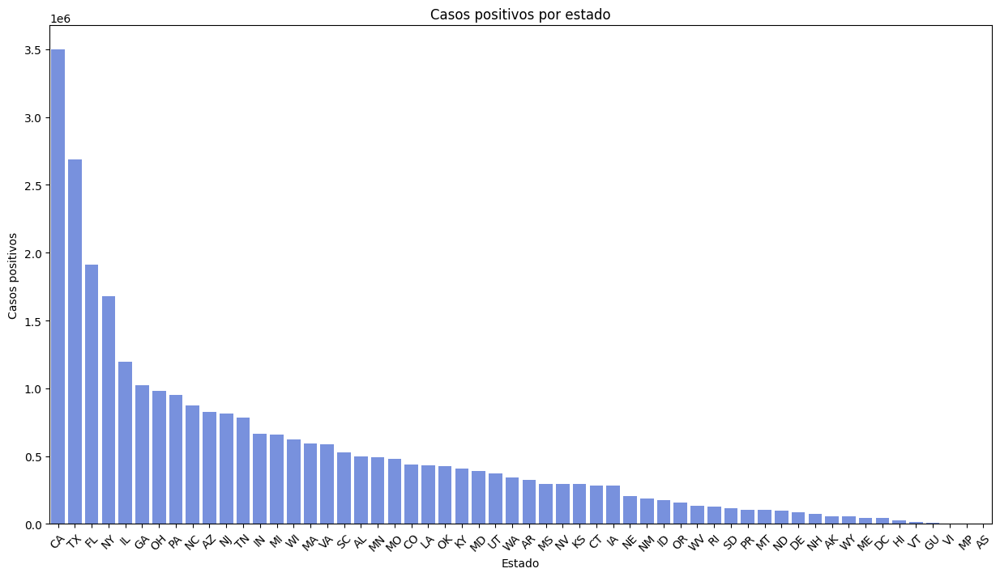

In [67]:
# Mostrar los estados según el número de casos positivos

# Agrupamos por estado y sumamos los casos positivos
pos_state = subset.groupby('state').agg({
    'positiveIncrease': 'sum',
    'hospitalizedIncrease': 'sum'
}).reset_index()

# Gráfico de barras para mostrar los casos positivos acumulados por estado usando Seaborn y Matplotlib
plt.figure(figsize=(15, 8))
sns.set_palette('coolwarm')

# Ordenamos los estados por el número de casos positivos acumulados
pos_state_sorted = pos_state.sort_values(by='positiveIncrease', ascending=False)

# Creamos el gráfico de barras
sns.barplot(x='state', y='positiveIncrease', data=pos_state_sorted, order=pos_state_sorted['state'])

plt.title('Casos positivos por estado')
plt.xlabel('Estado')
plt.ylabel('Casos positivos')
plt.xticks(rotation=45)
plt.show()

In [68]:
# Determinar los estados que tienen el 80% de los casos positivos reportados

# Calcular el total de casos positivos
total_positivos = pos_state['positiveIncrease'].sum()

# Ordenar los estados por el número de casos positivos acumulados
pos_state_sorted = pos_state.sort_values(by='positiveIncrease', ascending=False)

# Crear una nueva columna para el porcentaje acumulado de casos positivos
pos_state_sorted['cumulative_percentage'] = pos_state_sorted['positiveIncrease'].cumsum() / total_positivos * 100

# Filtrar los estados que suman hasta el 80% de los casos positivos
states_80_percent = pos_state_sorted[pos_state_sorted['cumulative_percentage'] <= 80]

print(states_80_percent)

   state  positiveIncrease  hospitalizedIncrease  cumulative_percentage
5     CA           3501341                     0              12.175870
47    TX           2686818                     0              21.519246
10    FL           1909209                 82237              28.158497
37    NY           1681169                     0              34.004741
16    IL           1198331                     0              38.171922
11    GA           1023485                 56797              41.731079
38    OH            978471                 50881              45.133699
41    PA            948643                     0              48.432594
30    NC            872175                     0              51.465571
4     AZ            826452                 57903              54.339548
34    NJ            812609                 64396              57.165386
46    TN            782205                 18870              59.885494
17    IN            667262                 43217              62

In [69]:
# Crear un dataframe de los estados que representan el 80% de los casos


# Obtener la lista de estados en 'states_80_percent'
states_80_list = states_80_percent['state'].tolist()

# Filtrar el 'subset' para incluir solo los estados en 'states_80_list'
subset_80_percent = subset[subset['state'].isin(states_80_list)]

# solo los estados del 80%
print(subset_80_percent['state'].unique())


['AL' 'AZ' 'CA' 'CO' 'FL' 'GA' 'IL' 'IN' 'MA' 'MI' 'MN' 'MO' 'NC' 'NJ'
 'NY' 'OH' 'PA' 'SC' 'TN' 'TX' 'VA' 'WI']


## Outliers

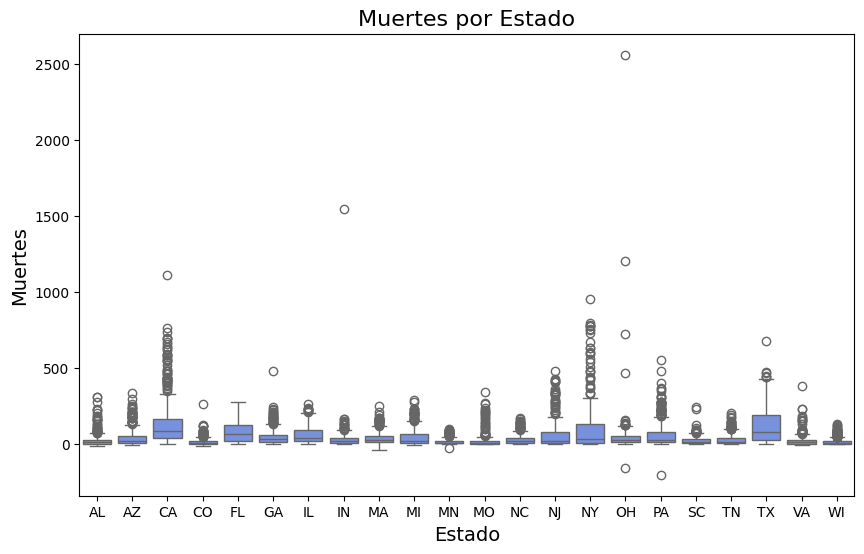

In [70]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='deathIncrease', data=subset_80_percent)

plt.title('Muertes por Estado', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Muertes', fontsize=14)

plt.show()

In [71]:
# Función para calcular y filtrar los outliers por estado
def remove_outliers_by_state(group):
    Q1 = group['deathIncrease'].quantile(0.25)
    Q3 = group['deathIncrease'].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar el grupo para eliminar outliers
    group_cleaned = group[(group['deathIncrease'] >= lower_bound) & (group['deathIncrease'] <= upper_bound)]

    return group_cleaned

# Aplicar la función a cada grupo de estado
subset_80_percent = subset_80_percent.groupby('state').apply(remove_outliers_by_state).reset_index(drop=True)

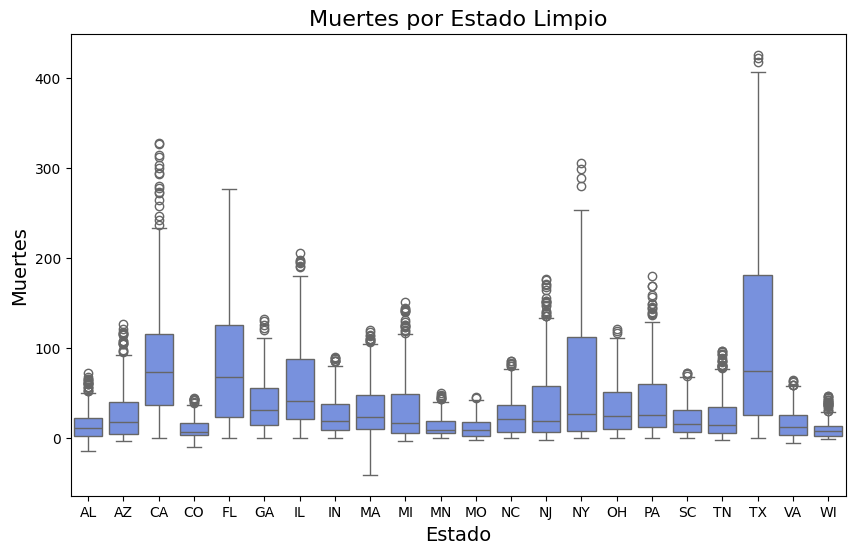

In [72]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='deathIncrease', data=subset_80_percent)

plt.title('Muertes por Estado Limpio', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Muertes', fontsize=14)

plt.show()

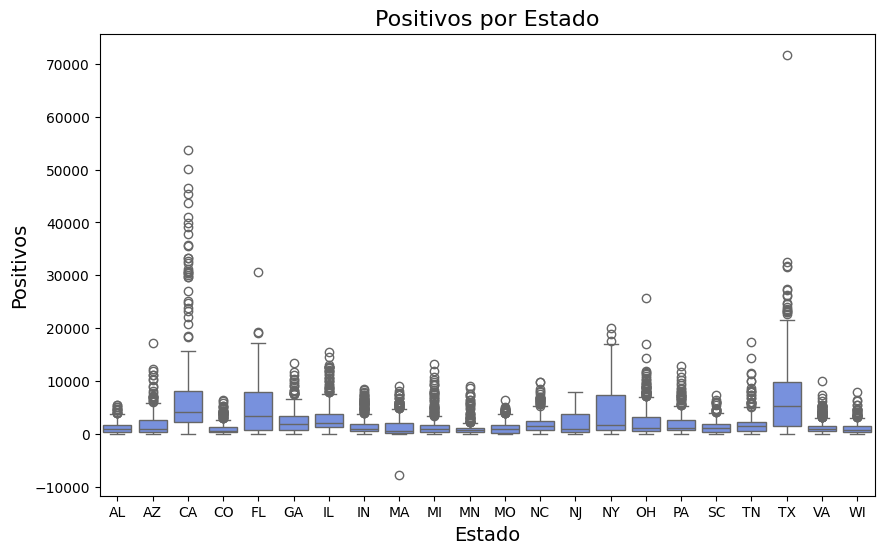

In [73]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='positiveIncrease', data=subset_80_percent)

plt.title('Positivos por Estado', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Positivos', fontsize=14)

plt.show()

In [74]:
# def replace_negative_with_median(group):
#     # Calcular la mediana del estado
#     median_death = group['positiveIncrease'].median()

#     # Reemplazar los valores negativos por la mediana
#     group['positiveIncrease'] = group['positiveIncrease'].apply(lambda x: median_death if x < 0 else x)

#     return group

# # Aplicar la función a cada grupo de estado
# subset_80_percent = subset_80_percent.groupby('state').apply(replace_negative_with_median).reset_index(drop=True)

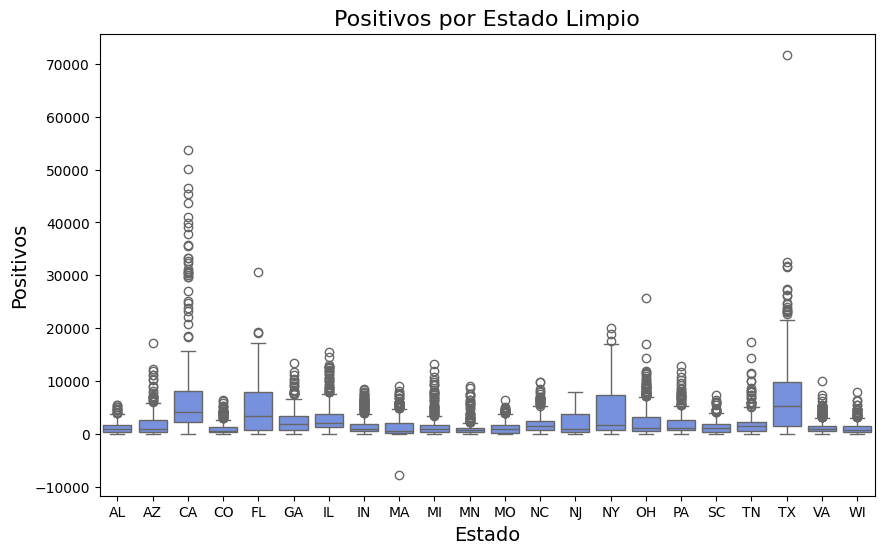

In [75]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='positiveIncrease', data=subset_80_percent)

plt.title('Positivos por Estado Limpio', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Positivos', fontsize=14)

plt.show()

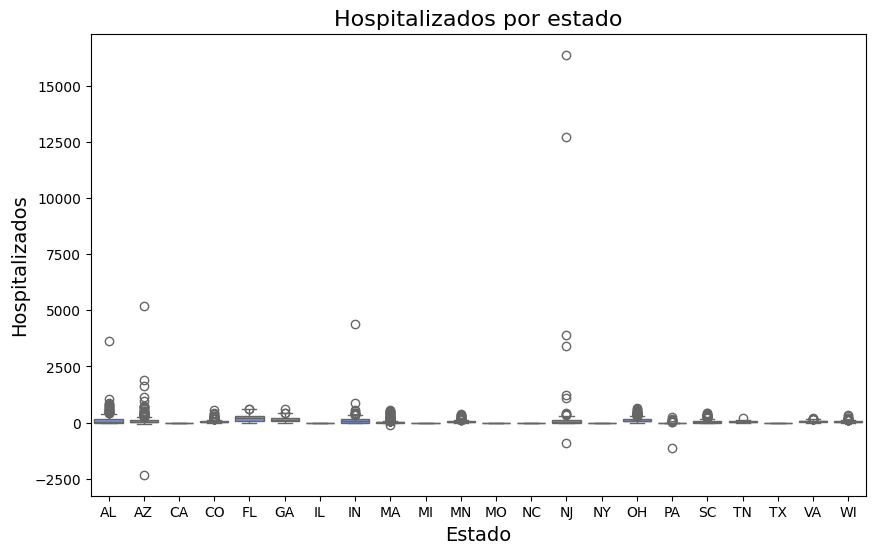

In [76]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='hospitalizedIncrease', data=subset_80_percent)

plt.title('Hospitalizados por estado', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Hospitalizados', fontsize=14)

plt.show()

In [77]:
# Función para calcular y filtrar los outliers por estado
def remove_outliers_by_state(group):
    Q1 = group['hospitalizedIncrease'].quantile(0.25)
    Q3 = group['hospitalizedIncrease'].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar el grupo para eliminar outliers
    group_cleaned = group[(group['hospitalizedIncrease'] >= lower_bound) & (group['hospitalizedIncrease'] <= upper_bound)]

    return group_cleaned

# Aplicar la función a cada grupo de estado
subset_80_percent = subset_80_percent.groupby('state').apply(remove_outliers_by_state).reset_index(drop=True)

In [78]:
def replace_negative_with_median(group):
    # Calcular la mediana del estado
    median_death = group['hospitalizedIncrease'].median()

    # Reemplazar los valores negativos por la mediana
    group['hospitalizedIncrease'] = group['hospitalizedIncrease'].apply(lambda x: median_death if x < 0 else x)

    return group

# Aplicar la función a cada grupo de estado
subset_80_percent = subset_80_percent.groupby('state').apply(replace_negative_with_median).reset_index(drop=True)

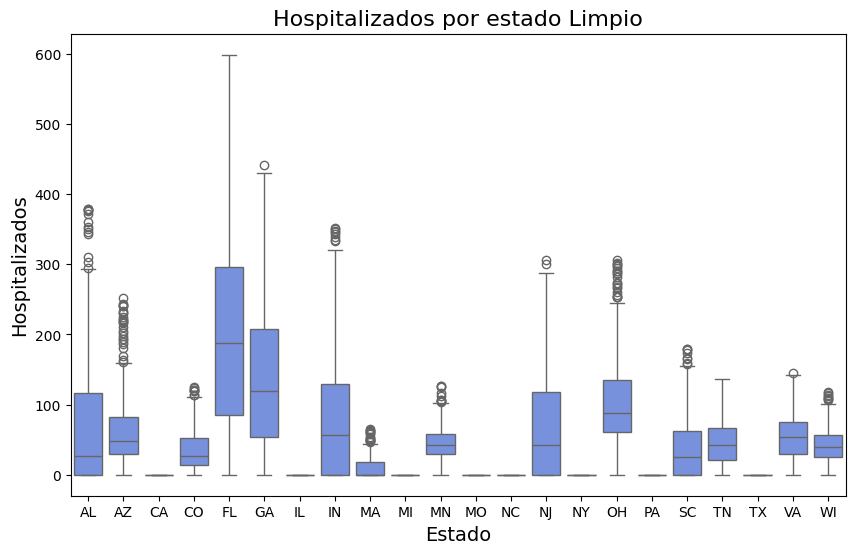

In [79]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='hospitalizedIncrease', data=subset_80_percent)

plt.title('Hospitalizados por estado Limpio', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Hospitalizados', fontsize=14)

plt.show()

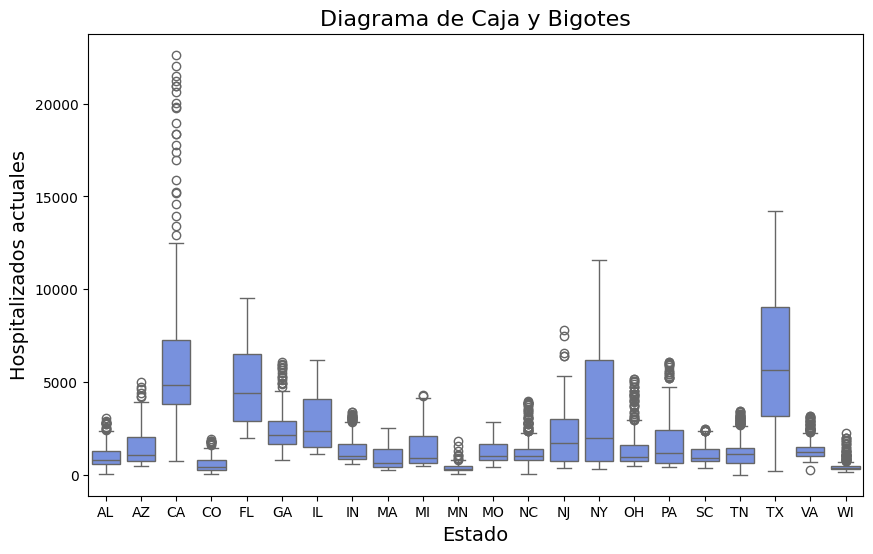

In [80]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='hospitalizedCurrently', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Hospitalizados actuales', fontsize=14)

plt.show()

## Analisis de Datos

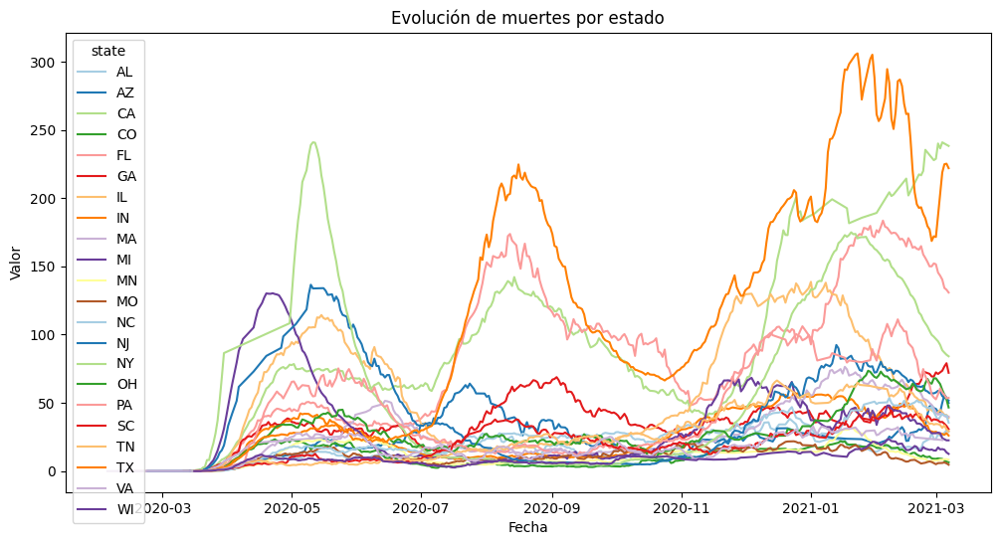

In [81]:
# Analisis de etndencias temporales

subset_80_percent['deathIncrease_rolling'] = subset_80_percent.groupby('state')['deathIncrease'].transform(lambda x: x.rolling(14).mean())

plt.figure(figsize=(12, 6))
sns.lineplot(data=subset_80_percent, x='date', y='deathIncrease_rolling', hue='state', palette='Paired')
plt.title('Evolución de muertes por estado')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.show()


plt.show()

In [82]:
mortality_state = subset.groupby('state').agg({
    'positiveIncrease': 'sum',
    'deathIncrease': 'sum',
    'hospitalizedIncrease': 'sum'
}).reset_index()

# Calcular el ratio de mortalidad por estado

perc_na.reset_index(drop=True, inplace=True)
mortality_state.reset_index(drop=True, inplace=True)
mortality_state['hospit_rate'] = (mortality_state['hospitalizedIncrease'] / mortality_state['positiveIncrease']) * 100 # hospitalizados por cada muerte, si es alto la at medica es buena
mortality_state['mortality_rate'] = (mortality_state['deathIncrease'] / mortality_state['positiveIncrease']) * 100


# Mostrar el ratio de mortalidad por estado
print(mortality_state.sort_values(by='mortality_rate', ascending=False))

   state  positiveIncrease  deathIncrease  hospitalizedIncrease  hospit_rate  \
34    NJ            812609          23574                 64396     7.924598   
21    MA            591356          16417                 19713     3.333525   
7     CT            285330           7704                     0     0.000000   
41    PA            948643          24349                     0     0.000000   
24    MI            656058          16658                     0     0.000000   
8     DC             41419           1030                     0     0.000000   
37    NY           1681169          39029                     0     0.000000   
28    MS            297581           6808                  9162     3.078826   
20    LA            433785           9748                     0     0.000000   
22    MD            387319           7955                 35651     9.204557   
35    NM            186922           3808                 13252     7.089588   
1     AL            499819          1014

Top 10 estados con mayor mortalidad: ['NJ', 'MA', 'CT', 'PA', 'MI', 'DC', 'NY', 'MS', 'LA', 'MD']
Estados con datos de mortalidad después de unir: ['Louisiana', 'Connecticut', 'Massachusetts', 'Mississippi', 'District of Columbia', 'Maryland', 'New Jersey', 'New York', 'Pennsylvania', 'Michigan']
Número de estados con datos de mortalidad: 10


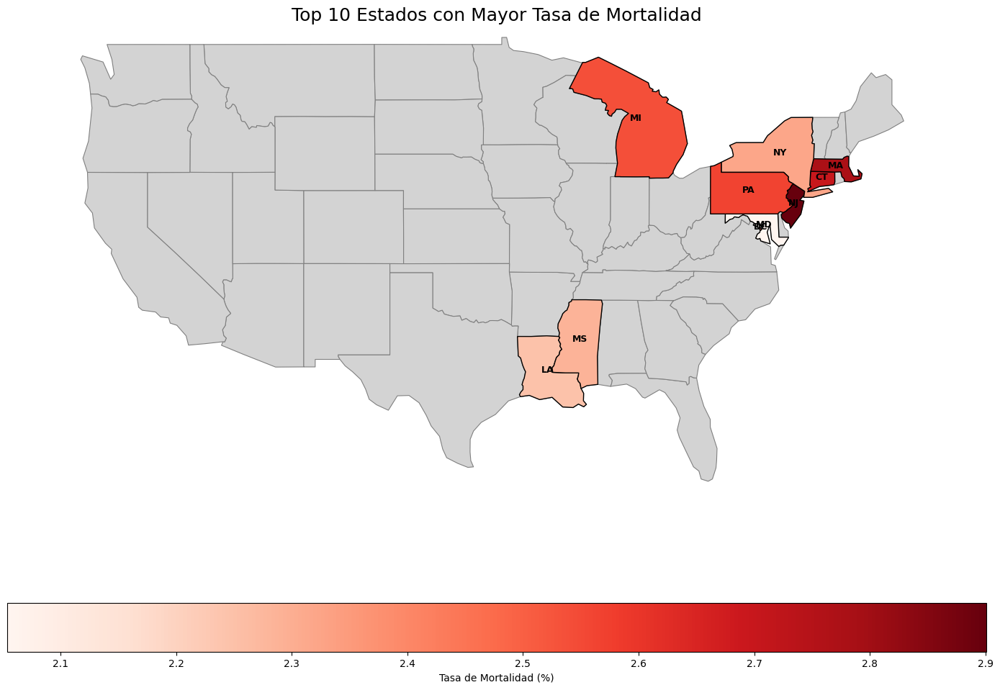

In [83]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Patch

# Cargar el shapefile
shapefile_path = "ne_110m_admin_1_states_provinces.shp"
usa_states = gpd.read_file(shapefile_path)

# Filtrar solo los estados de EE.UU.
usa_states = usa_states[usa_states['iso_a2'] == 'US']

# Obtener los 10 estados con mayor tasa de mortalidad
top_10_mortality_states = mortality_state.sort_values(by='mortality_rate', ascending=False).head(10)
print("Top 10 estados con mayor mortalidad:", top_10_mortality_states['state'].tolist())

# Crear el mapa
fig, ax = plt.subplots(1, 1, figsize=(14, 10))

# Unir los datos con los shapefile usando códigos postales
merged = usa_states.merge(
    top_10_mortality_states,
    left_on='postal',
    right_on='state',
    how='left'
)

# Dibujar todos los estados en gris
usa_states.plot(ax=ax, color='lightgray', edgecolor='gray', linewidth=0.8)

# Comprobar si hay datos de mortalidad después de la unión
print("Estados con datos de mortalidad después de unir:", merged[~merged['mortality_rate'].isna()]['name'].tolist())
print("Número de estados con datos de mortalidad:", merged['mortality_rate'].notna().sum())

# Dibujar solo los estados con datos de mortalidad en color
if merged['mortality_rate'].notna().sum() > 0:
    # Crear una máscara para los 10 estados principales
    top_states_mask = ~merged['mortality_rate'].isna()

    # Graficar solo esos estados con color
    merged[top_states_mask].plot(
        ax=ax,
        column='mortality_rate',
        cmap='Reds',  # Usar colormap Reds para mejor visibilidad
        legend=True,
        legend_kwds={'label': "Tasa de Mortalidad (%)", 'orientation': 'horizontal'},
        edgecolor='black',
        linewidth=1.0
    )

    # Añadir etiquetas de estado para los 10 principales
    for idx, row in merged[top_states_mask].iterrows():
        plt.annotate(
            text=row['state'],  # Usar la abreviatura para las etiquetas
            xy=(row.geometry.centroid.x, row.geometry.centroid.y),
            ha='center',
            fontsize=9,
            color='black',
            fontweight='bold'
        )
else:
    print("¡Advertencia: No se unieron correctamente los datos de mortalidad con el shapefile!")

# Establecer límites del mapa para hacer zoom en los 48 estados contiguos (excluyendo Alaska y Hawái)
# Estas coordenadas cubren aproximadamente los límites de los 48 estados contiguos
lower48_bounds = {
    'xmin': -125.0,  # Costa oeste
    'xmax': -66.0,   # Costa este
    'ymin': 24.0,    # Sur de Florida
    'ymax': 50.0     # Frontera norte
}

# Aplicar los límites para hacer zoom
plt.xlim(lower48_bounds['xmin'], lower48_bounds['xmax'])
plt.ylim(lower48_bounds['ymin'], lower48_bounds['ymax'])

# Título y personalización
plt.title('Top 10 Estados con Mayor Tasa de Mortalidad', fontsize=18)
plt.axis('off')  # Desactivar los ejes
plt.tight_layout()
plt.show()

In [84]:
# Elegir estados que tienen datos
states_to_delete = ['CA', 'TX', 'NY', 'IL', 'PA', 'NC', 'MI', 'MO']

subset_decent_data = subset_80_percent[~subset_80_percent['state'].isin(states_to_delete)]

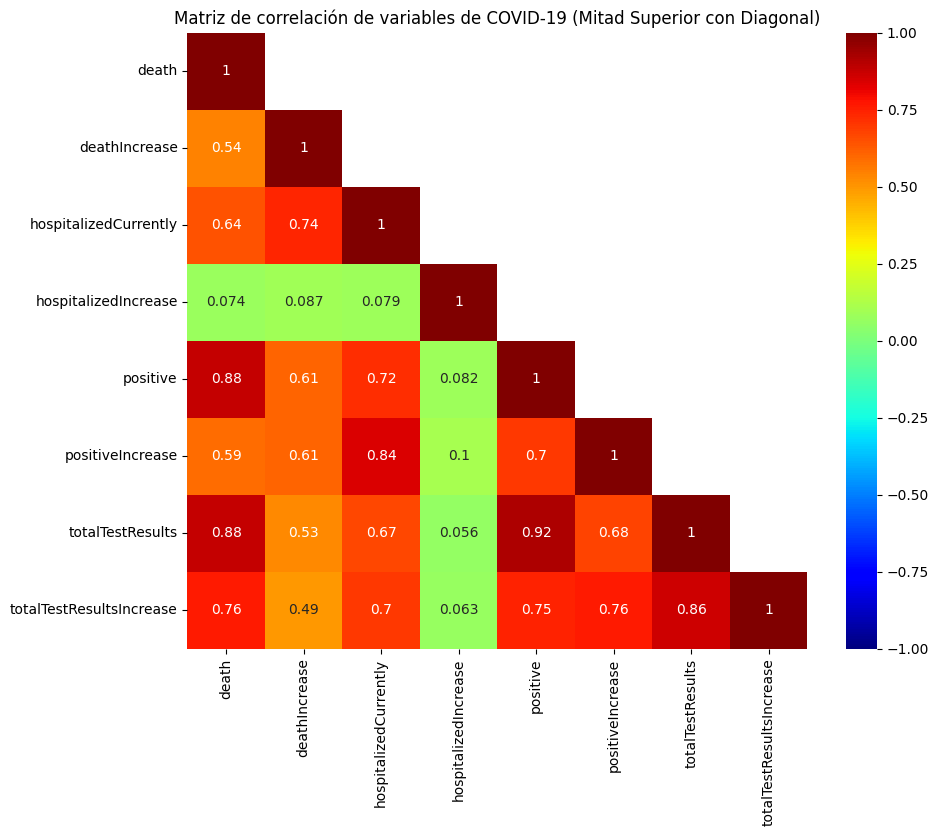

In [85]:
# Analisis e correlaciones
numerics = ["death", "deathIncrease","hospitalizedCurrently", "hospitalizedIncrease","positive", "positiveIncrease", "totalTestResults", "totalTestResultsIncrease"]

# Crear matriz de correlación
corr_matrix = df[numerics].corr()

# Crear una máscara para ocultar la mitad inferior de la matriz, pero dejando visible la diagonal
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

# Crear mapa de calor con anotaciones
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='jet', vmin=-1, vmax=1, center=0)

plt.title('Matriz de correlación de variables de COVID-19 (Mitad Superior con Diagonal)')
plt.show()